## **Crop Disease Detection**

`Problem Statement:`

Farmers often face challenges in identifying crop diseases, which can significantly reduce yield and impact agricultural productivity. Despite their best efforts in selecting and cultivating crops, many diseases remain undetected until it's too late. This project addresses this critical issue by leveraging AI technology to develop a model capable of diagnosing crop diseases from images of affected plants. By providing farmers with a tool to identify diseases early, we can enhance crop yield, sustain production levels, and contribute to agricultural resilience.

In [1]:
#Import dependencies
import os
import random
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from tensorflow.keras import models, layers
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, Conv2D


import warnings
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns', None)
warnings.filterwarnings('ignore', category=UserWarning, module="tensorflow_io")


**Data Collection and Preprocessing**

In [2]:
img_dim = (256, 256)
BATCH_SIZE = 32
EPOCHS = 5
CHANNELS = 3
BASE_DIR = "D:/Jobs/plant disease prediction/Plant Disease Dataset/"

input_size = (BATCH_SIZE, img_dim[0], img_dim[1], CHANNELS)

In [3]:
#losding the dataset and labels from the path
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "D:/Jobs/plant disease prediction/Plant Disease Dataset/", 
    shuffle=True,
    image_size= img_dim,
    batch_size= BATCH_SIZE,
)

Found 67118 files belonging to 9 classes.


In [4]:
class_names = dataset.class_names
class_names

['Apple',
 'Bell Pepper',
 'Cherry',
 'Corn (Maize)',
 'Grape',
 'Peach',
 'Potato',
 'Strawberry',
 'Tomato']

....Sample Image from dataset


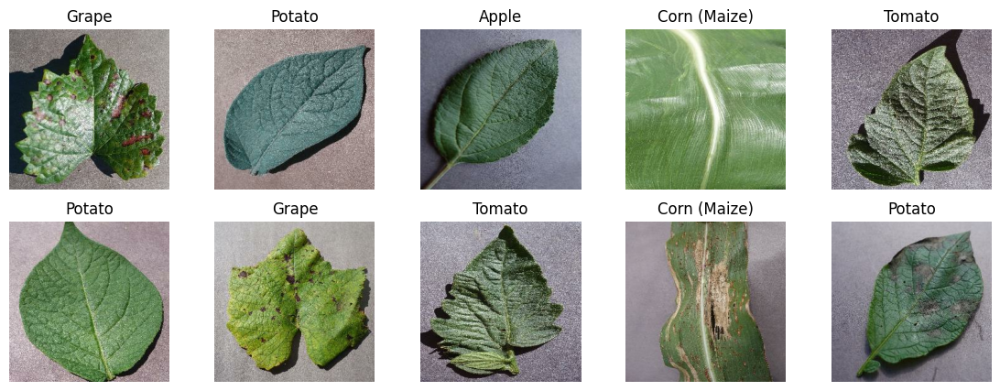

In [5]:
print("....Sample Image from dataset")
plt.figure(figsize=(14,5))
    
for image_batch, label_batch in dataset.take(1):
    for i in range (10):
        plt.subplot(2,5, i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(dataset.class_names[label_batch[i].numpy()])
        plt.axis('off')
    plt.show()
print("\n\n")

In [6]:
n_classes = len(class_names)
n_classes

9

In [7]:
from sklearn.preprocessing import StandardScaler

def std_img(img):
    img_flat = img.reshape(-1,3)
    scaler = StandardScaler()
    img_std = scaler.fit_transform(img_flat)
    img_std = img_std.reshape(256, 256, 3)
    return img_std

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


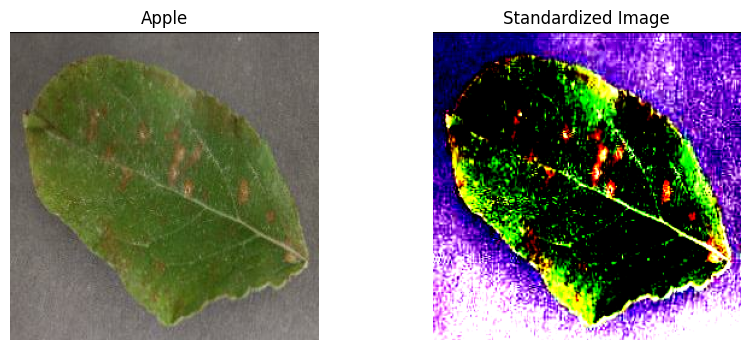

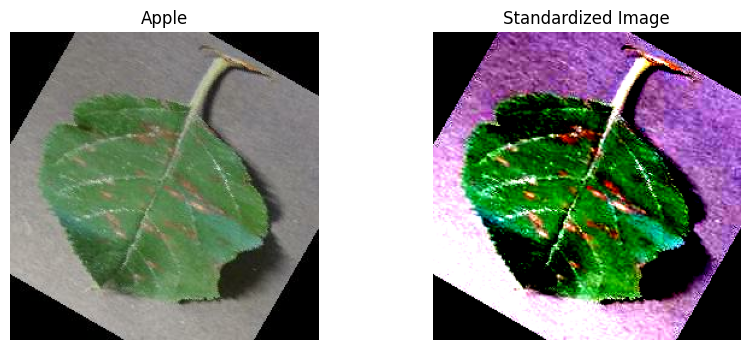

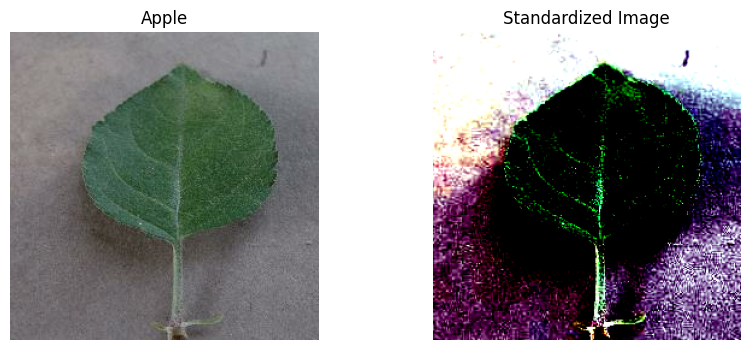

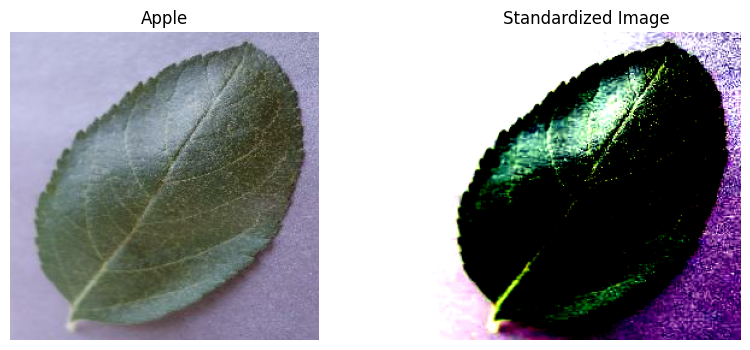

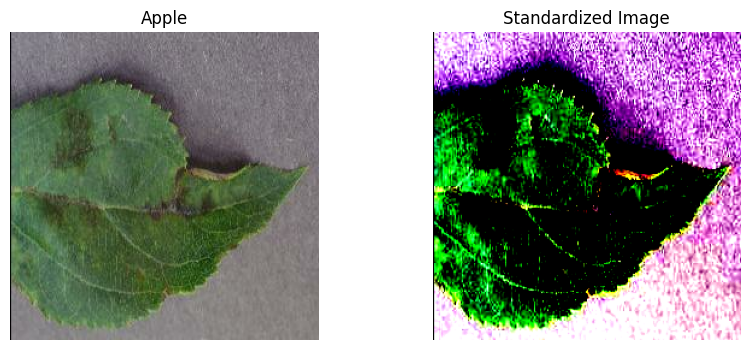

In [8]:
apple_img = []
apple_label = []

for img_batch, label_batch in dataset.take(1):  
    for i in range(len(label_batch)):  
        if dataset.class_names[label_batch[i].numpy()] == "Apple":  
            apple_img.append(img_batch[i])
            apple_label.append("Apple")     

for i in range(5):        
    nik = np.array(apple_img[i]).astype('uint8')
    img_std = std_img(nik)


    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(nik)
    plt.title(f"{apple_label[i]}")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img_std)
    plt.title('Standardized Image')
    plt.axis('off')
plt.show()      

In [9]:
len(dataset)

2098

In [10]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[8 4 6 4 5 2 0 4 3 4 4 4 4 3 8 0 3 6 5 8 8 7 7 2 6 8 8 7 4 8 1 3]


In [11]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch[0].shape)


(256, 256, 3)


In [12]:
plants = [
'Apple',
'Bell Pepper',
'Cherry',
'Corn (Maize)',
'Grape',
'Peach',
'Potato',
'Strawberry',
'Tomato'
]

BASE_DIR = "D:/Jobs/plant disease prediction/Plant Disease Dataset/"

In [13]:
# Declaring paths for training, testing and validation for the given plant disease
for plant in plants:
    print(f"\n.....Processing plant: {plant}")
    
    train_path = os.path.join(BASE_DIR, plant, "Train")
    test_path = os.path.join(BASE_DIR, plant, "Test")
    val_path = os.path.join(BASE_DIR, plant, "Val")
    
    if not os.path.exists(train_path):
        print(f"Train path does not exit for {plant}: {train_path}")
        continue

    out_labels = os.listdir(train_path)
    out_len = len(out_labels)
    
    print(f"Train path: {train_path}")
    print(f"Test path: {test_path}")
    print(f"Validation path: {val_path}")
    print(f"Classes: {out_labels}")
    print(f"Number of classes: {out_len}")


.....Processing plant: Apple
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Apple\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Apple\Test
Validation path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Apple\Val
Classes: ['Apple Scab', 'Black Rot', 'Cedar Apple Rust', 'Healthy']
Number of classes: 4

.....Processing plant: Bell Pepper
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Bell Pepper\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Bell Pepper\Test
Validation path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Bell Pepper\Val
Classes: ['Bacterial Spot', 'Healthy']
Number of classes: 2

.....Processing plant: Cherry
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Cherry\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Cherry\Test
Validation path: D:/Jobs/plant disease prediction/Plant Disease Dataset/Cherry\Val
Classes: ['Healthy'

In [14]:
batch_size = 32
img_height = 255

In [15]:
train_datagen = ImageDataGenerator(
    rescale = 1./255.,
    rotation_range=20,
    shear_range=0.15,
    horizontal_flip=True,
    )
val_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

In [16]:
train_set = train_datagen.flow_from_directory(train_path,target_size = (255,255),
                                              batch_size = 32,
                                              shuffle = True,
                                              class_mode = 'categorical')

val_set = val_datagen.flow_from_directory(val_path,target_size = (255, 255),
                                          batch_size = 32,
                                          shuffle = False,
                                          class_mode = 'categorical')

test_set = val_datagen.flow_from_directory(test_path,target_size = (255, 255),
                                           batch_size = 32,
                                           shuffle = False,
                                           class_mode = 'categorical')

Found 11108 images belonging to 6 classes.
Found 2495 images belonging to 6 classes.
Found 280 images belonging to 6 classes.


In [17]:
# Check TensorFlow version and GPU availability
print("TensorFlow Version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow Version: 2.10.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


**Model Building**

In [18]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

print("Available Devices:")
print(device_lib.list_local_devices())


Available Devices:
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 8205414293410185070
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2903926375
locality {
  bus_id: 1
  links {
  }
}
incarnation: 7827875817083958092
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
xla_global_id: 416903419
]


In [19]:
import tensorflow_hub as hub
from tensorflow.keras.applications import InceptionV3

# Load pretrained InceptionV3 model and feature extractor
base_model = InceptionV3(
    weights = "imagenet",
    include_top = False, 
    input_shape=(225,225, 3),               
    )

base_model.trainable=False

Incep = tf.keras.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation="softmax", name="output_layer")
])

# Compile the model
Incep.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss="categorical_crossentropy", 
    metrics=['accuracy'],
    )


In [20]:
#show model summary
Incep.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 output_layer (Dense)        (None, 6)                 1542      
                                                                 
Total params: 22,328,870
Trainable params: 526,086
Non-trainable params: 21,802,784
______________________________________

In [21]:
#train the model

history = Incep.fit(
    train_set,
    validation_data=val_set,
    epochs=15,
    verbose=1,
)


Epoch 1/15
348/348 [==============================] - 478s 1s/step - loss: 1.0417 - accuracy: 0.6167 - val_loss: 0.6132 - val_accuracy: 0.8100
Epoch 2/15
348/348 [==============================] - 175s 503ms/step - loss: 0.6153 - accuracy: 0.7839 - val_loss: 0.4757 - val_accuracy: 0.8457
Epoch 3/15
348/348 [==============================] - 175s 502ms/step - loss: 0.5014 - accuracy: 0.8271 - val_loss: 0.4132 - val_accuracy: 0.8649
Epoch 4/15
348/348 [==============================] - 179s 515ms/step - loss: 0.4416 - accuracy: 0.8462 - val_loss: 0.3616 - val_accuracy: 0.8802
Epoch 5/15
348/348 [==============================] - 176s 506ms/step - loss: 0.4013 - accuracy: 0.8615 - val_loss: 0.3348 - val_accuracy: 0.8906
Epoch 6/15
348/348 [==============================] - 175s 502ms/step - loss: 0.3676 - accuracy: 0.8749 - val_loss: 0.3149 - val_accuracy: 0.8934
Epoch 7/15
348/348 [==============================] - 177s 507ms/step - loss: 0.3511 - accuracy: 0.8758 - val_loss: 0.2926 - va

In [22]:
# Evaluate the model
test_loss, test_accuracy = Incep.evaluate(test_set)
print(f"Test Accuracy: {test_accuracy:.2f}")


9/9 [==============================] - 5s 605ms/step - loss: 0.2134 - accuracy: 0.9357
Test Accuracy: 0.94


In [23]:
history.params

{'verbose': 1, 'epochs': 15, 'steps': 348}

In [24]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [25]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

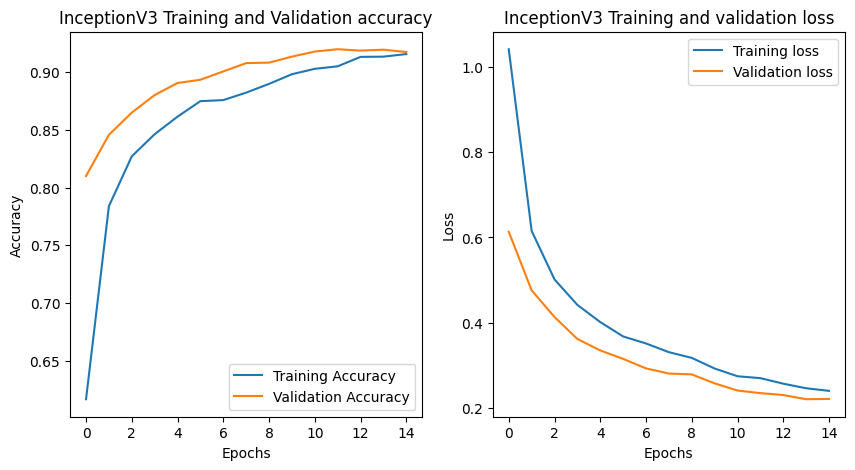

In [28]:
# plot training and validation accuracy values

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot(range(15), acc, label="Training Accuracy")
plt.plot(range(15), val_acc, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")
plt.title("InceptionV3 Training and Validation accuracy")


# Plot training and validation loss values

plt.subplot(1,2,2)
plt.plot(range(15), loss, label="Training loss")
plt.plot(range(15), val_loss, label="Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc="upper right")
plt.title("InceptionV3 Training and validation loss")
plt.show()

First image to predict


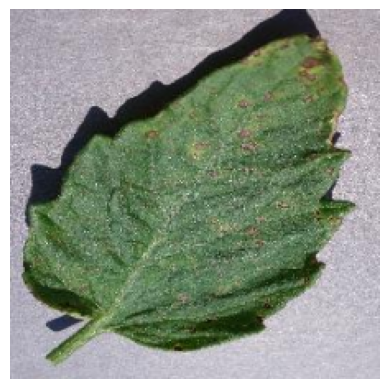

1/1 [==============================] - 0s 70ms/step
Actual label: Septoria Leaf Spot
Predicted label: Septoria Leaf Spot (Confidence: 0.97)


In [36]:
# Reverse the class indices mapping (index to class name)
class_indices = {v: k for k, v in test_set.class_indices.items()}


images_batch, labels_batch = next(iter(test_set))

images_batch_resized = tf.image.resize(images_batch, (225, 225))
first_image = (images_batch_resized[0] * 255).numpy().astype("uint8")  

# Map the first label from one-hot to class name
first_label_index = np.argmax(labels_batch[0])  
first_label = class_indices[first_label_index]  

print("First image to predict")
plt.imshow(first_image)
plt.axis("off")
plt.show()


predictions = Incep.predict(images_batch_resized)
predicted_labels = [class_indices[np.argmax(pred)] for pred in predictions]

# Display the first prediction
confidence = predictions[0][np.argmax(predictions[0])]  
print(f"Actual label: {first_label}")
print(f"Predicted label: {predicted_labels[0]} (Confidence: {confidence:.2f})")


1/1 [==============================] - 0s 34ms/step


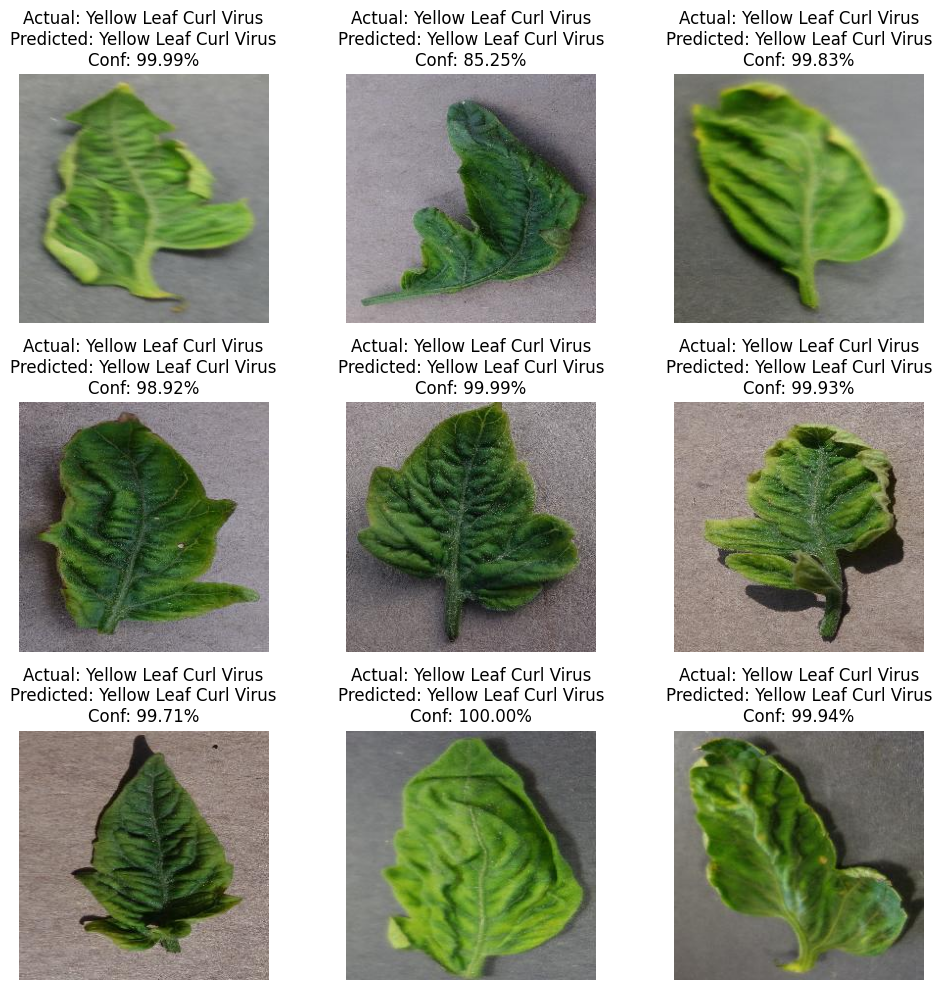

In [37]:
# Function to predict and return the class name and confidence.
# Ensure the image is normalized and reshaped for prediction
def predict(model, img, class_names):
    
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  
    
    predictions = model.predict(img_array)  
    predicted_index = np.argmax(predictions[0])  
    confidence = predictions[0][predicted_index] * 100  
    predicted_class = class_names[predicted_index]  

    return predicted_class, confidence




# Extract class names from the test set
class_names = list(test_set.class_indices.keys())
images_batch, labels_batch = next(iter(test_set))
# Rescale images
images_batch_rescaled = (images_batch * 255).astype("uint8")  

plt.figure(figsize=(10, 10))
for i in range(9):  
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_batch_rescaled[i])  
    
    # Get predictions and actual class
    predicted_class, confidence = predict(Incep, images_batch[i], class_names)
    actual_class = class_names[np.argmax(labels_batch[i])]  
   
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConf: {confidence:.2f}%")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [39]:
import os

# Define model save paths
saved_model_dir = "../saved_model/plant_disease_Inception_model"
h5_model_path = "../saved_model/plant_disease_Inception_model.h5"

# Ensure the save directory exists
os.makedirs(os.path.dirname(saved_model_dir), exist_ok=True)

# Save as TensorFlow's SavedModel format (.keras)
Incep.save(saved_model_dir)
print(f"Model saved in Keras format: {saved_model_dir}")

# Save as HDF5 format (.h5)
Incep.save(h5_model_path)
print(f"Model saved in HDF5 format: {h5_model_path}")


INFO:tensorflow:Assets written to: ../saved_model/plant_disease_Inception_model\assets


INFO:tensorflow:Assets written to: ../saved_model/plant_disease_Inception_model\assets


Model saved in Keras format: ../saved_model/plant_disease_Inception_model
Model saved in HDF5 format: ../saved_model/plant_disease_Inception_model.h5


## **Crop Disease Detection**

Project description - 

In [ ]:

IMAGE_SIZE = 255
BATCH_SIZE = 32
EPOCHS = 10
CHANNELS = 3
BASE_DIR = "D:/Jobs/plant disease prediction/Plant Disease Dataset/"


In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    BASE_DIR, 
    shuffle=True,
    image_size= (IMAGE_SIZE, IMAGE_SIZE),
    batch_size= BATCH_SIZE
)

Found 67118 files belonging to 9 classes.


In [ ]:
# Function to get the path for folder paths

def get_path(plant_dir:str, dir_test:str):
    if dir_test == 'Test':
        return "D:/Jobs/plant disease prediction/Plant Disease Dataset/" + plant_dir + '/Test'
    elif dir_test == 'Train':
        return "D:/Jobs/plant disease prediction/Plant Disease Dataset/" + plant_dir + '/Train'
    elif dir_test == 'Val':
        return "D:/Jobs/plant disease prediction/Plant Disease Dataset/" + plant_dir + '/Val'
    
plant_dirs = os.listdir("D:/Jobs/plant disease prediction/Plant Disease Dataset/")

plant_dirs

['Apple',
 'Bell Pepper',
 'Cherry',
 'Corn (Maize)',
 'Grape',
 'Peach',
 'Potato',
 'Strawberry',
 'Tomato']

In [ ]:
# Show the information for the training set, directories and images

img_dim = (255,255)
batch_size = 32
num_channels = 3
input_size = (batch_size, img_dim[0], img_dim[1], num_channels)
train_dataset = {}


for plant in plant_dirs:
    print('....No of Images & Classes in "{}" directory'.format(plant))
    train_dataset[plant] = image_dataset_from_directory(get_path(plant, "Train"),
shuffle=True,
labels = 'inferred',
label_mode = 'int',
image_size = img_dim,
batch_size = batch_size)

....No of Images & Classes in "Apple" directory
Found 7771 files belonging to 4 classes.
....No of Images & Classes in "Bell Pepper" directory
Found 3901 files belonging to 2 classes.
....No of Images & Classes in "Cherry" directory
Found 3509 files belonging to 2 classes.
....No of Images & Classes in "Corn (Maize)" directory
Found 7316 files belonging to 4 classes.
....No of Images & Classes in "Grape" directory
Found 7222 files belonging to 4 classes.
....No of Images & Classes in "Peach" directory
Found 3566 files belonging to 2 classes.
....No of Images & Classes in "Potato" directory
Found 5702 files belonging to 3 classes.
....No of Images & Classes in "Strawberry" directory
Found 3598 files belonging to 2 classes.
....No of Images & Classes in "Tomato" directory
Found 11108 files belonging to 6 classes.


In [ ]:
# Show disease names of each plant 

classes = {}

for plant in plant_dirs:
    print("....Classes in {} dataset :-".format(plant))
    classes[plant] = []
    for num, cat in enumerate(train_dataset[plant].class_names, start=1):
        classes[plant].append(cat)
        print(num, cat)
    print("\n")

....Classes in Apple dataset :-
1 Apple Scab
2 Black Rot
3 Cedar Apple Rust
4 Healthy


....Classes in Bell Pepper dataset :-
1 Bacterial Spot
2 Healthy


....Classes in Cherry dataset :-
1 Healthy
2 Powdery Mildew


....Classes in Corn (Maize) dataset :-
1 Cercospora Leaf Spot
2 Common Rust
3 Healthy
4 Northern Leaf Blight


....Classes in Grape dataset :-
1 Black Rot
2 Esca (Black Measles)
3 Healthy
4 Leaf Blight


....Classes in Peach dataset :-
1 Bacterial Spot
2 Healthy


....Classes in Potato dataset :-
1 Early Blight
2 Healthy
3 Late Blight


....Classes in Strawberry dataset :-
1 Healthy
2 Leaf Scorch


....Classes in Tomato dataset :-
1 Bacterial Spot
2 Early Blight
3 Healthy
4 Late Blight
5 Septoria Leaf Spot
6 Yellow Leaf Curl Virus




.....Sample images of "Apple" dataset


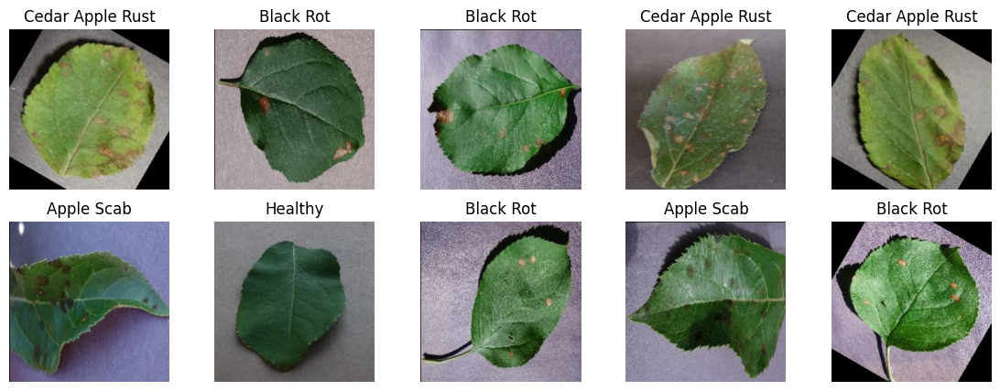



.....Sample images of "Bell Pepper" dataset


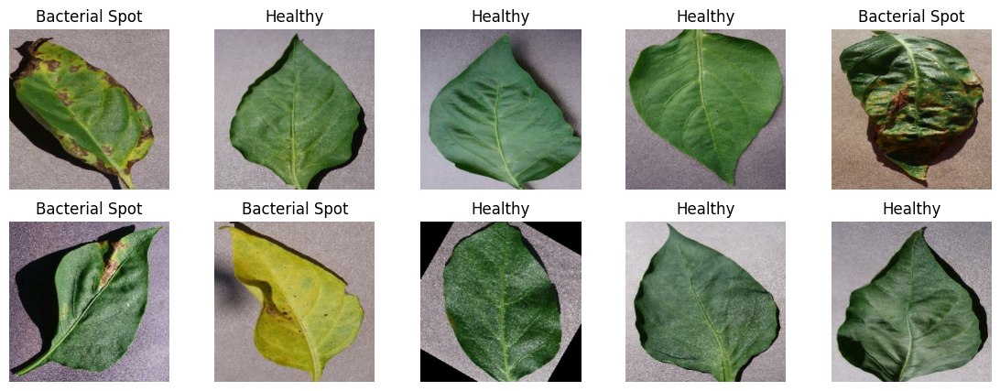



.....Sample images of "Cherry" dataset


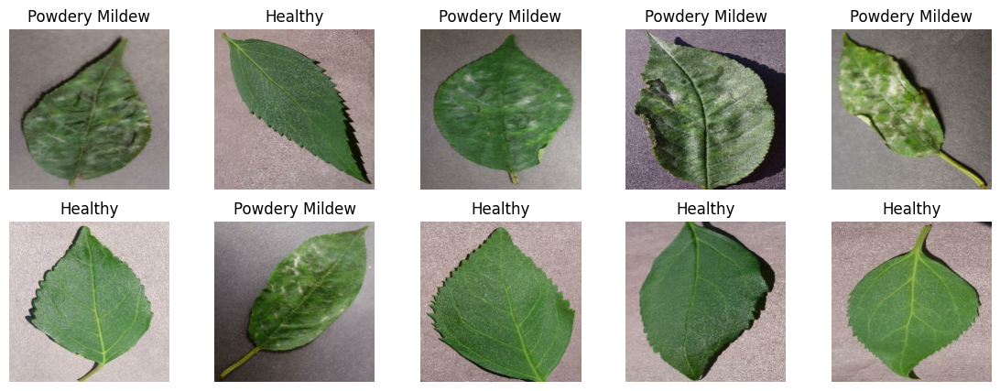



.....Sample images of "Corn (Maize)" dataset


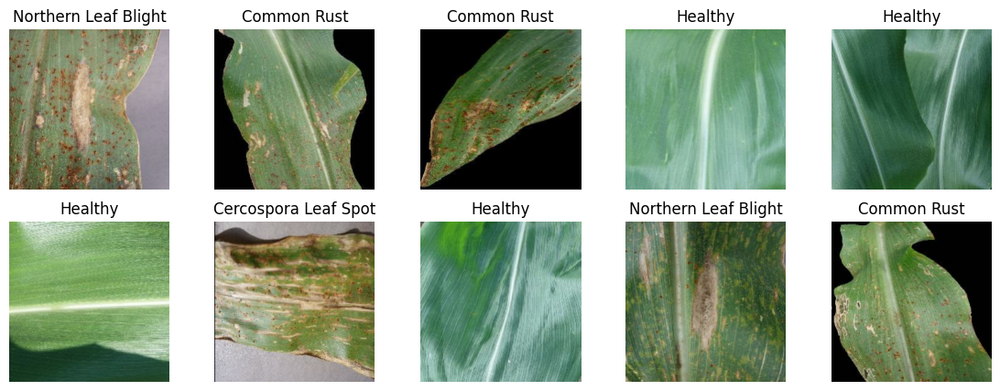



.....Sample images of "Grape" dataset


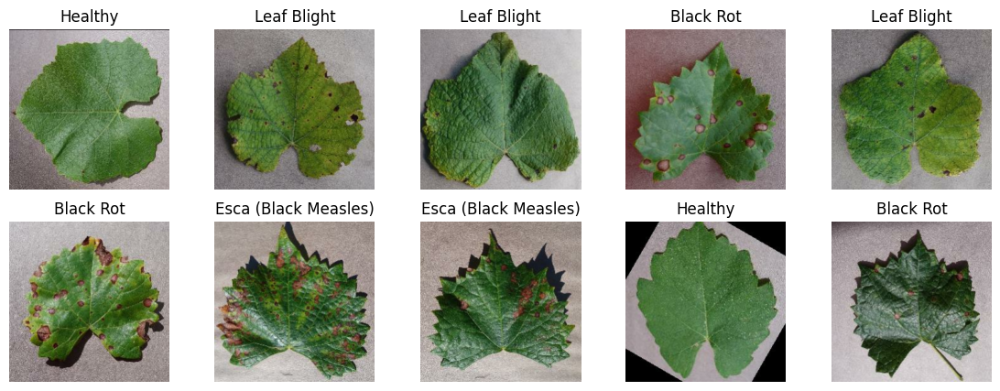



.....Sample images of "Peach" dataset


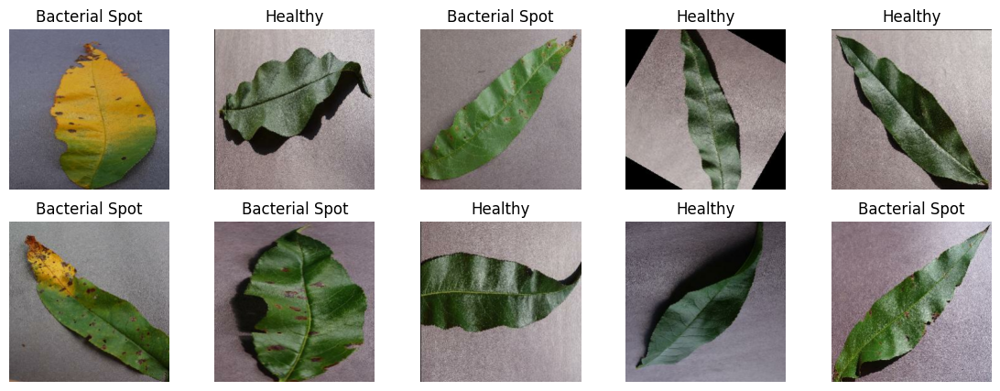



.....Sample images of "Potato" dataset


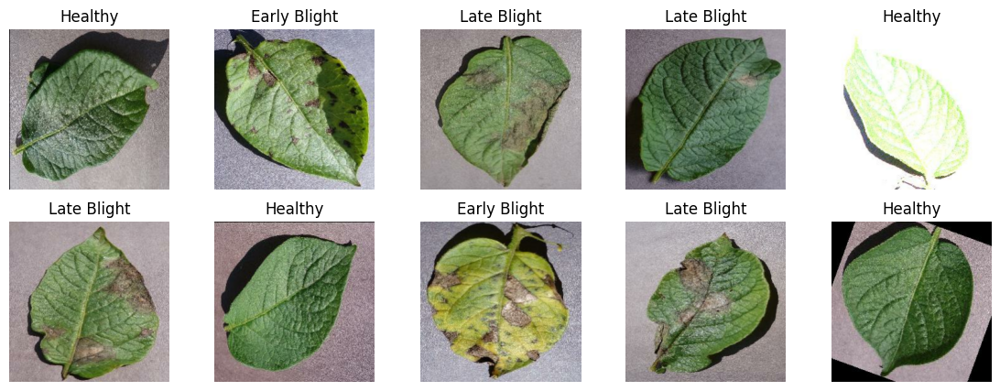



.....Sample images of "Strawberry" dataset


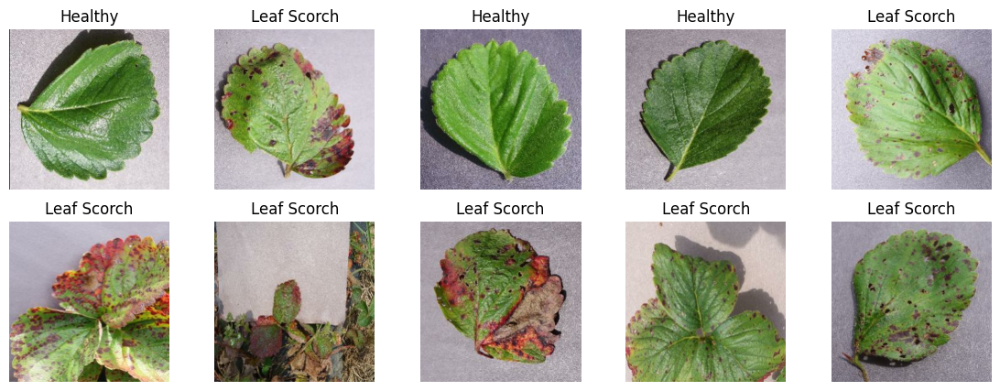



.....Sample images of "Tomato" dataset


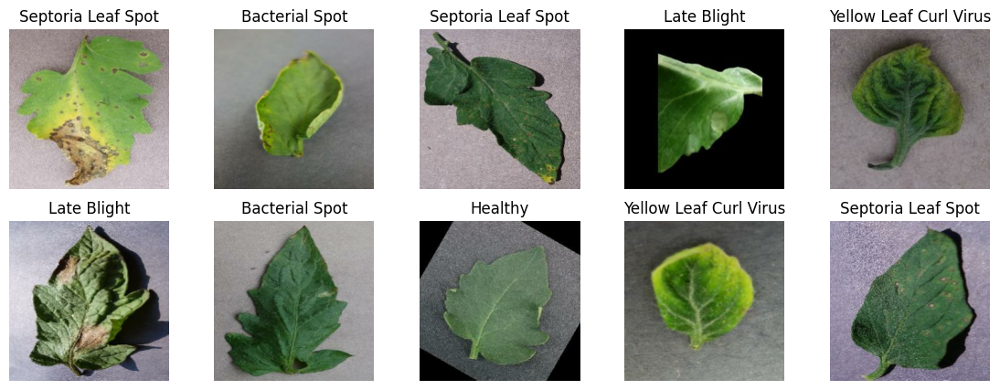

In [ ]:
# Plot random samples from each plant directory

for plant in plant_dirs:
    print('.....Sample images of "{}" dataset'.format(plant))
    plt.figure(figsize=(14,5))
    for image_batch, image_label in train_dataset[plant].take(1):
        for i in range(10):
            plt.subplot(2,5, i+1)
            plt.imshow(image_batch[i].numpy().astype('uint8'))
            plt.title(classes[plant][image_label[i]])
            plt.axis('off')
        plt.show()
    print("\n")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


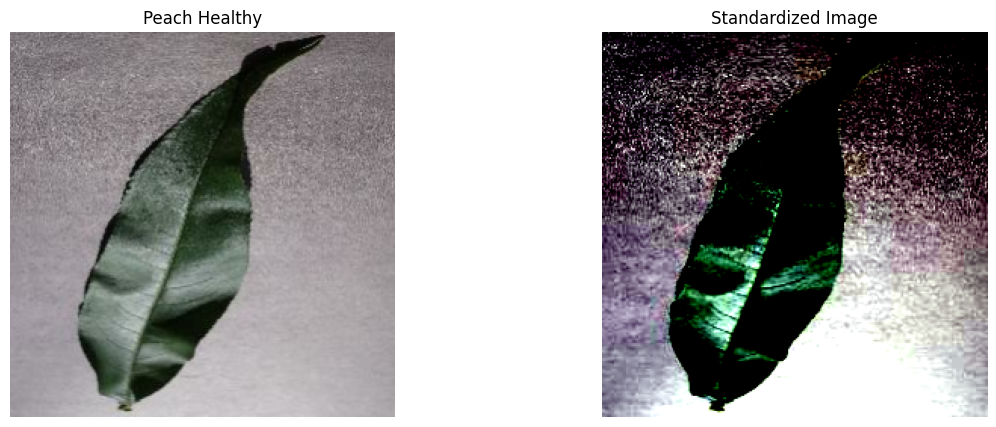

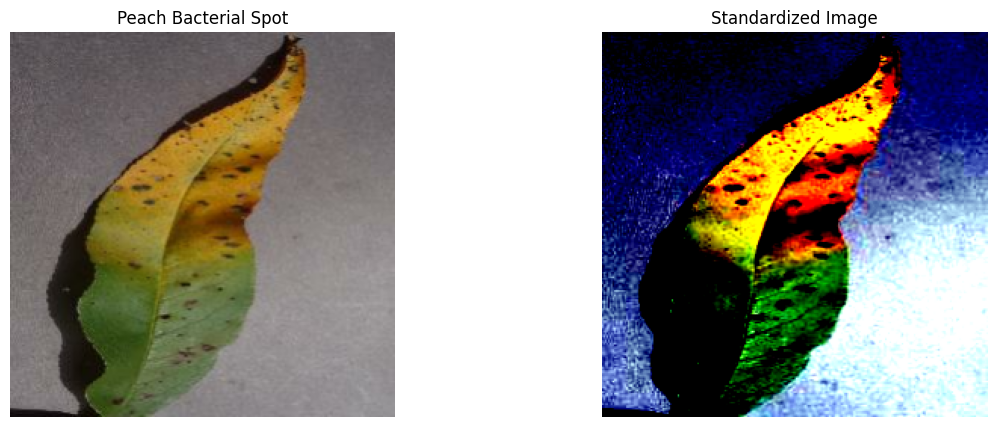

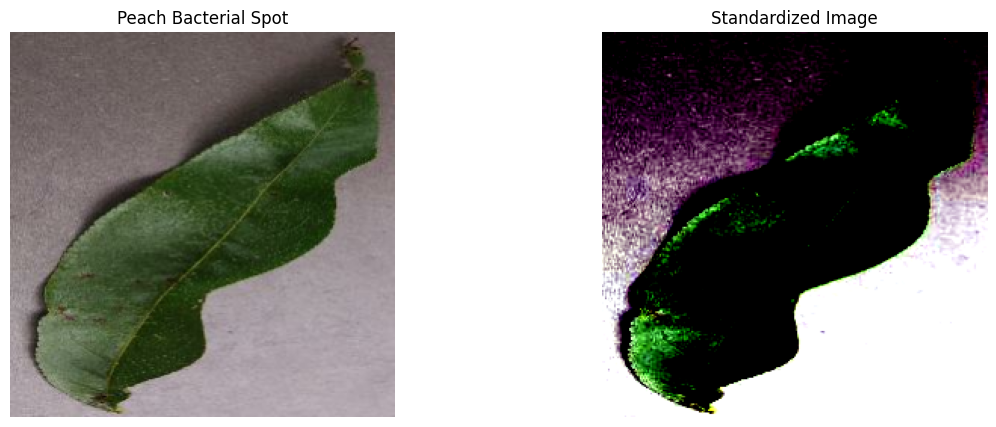

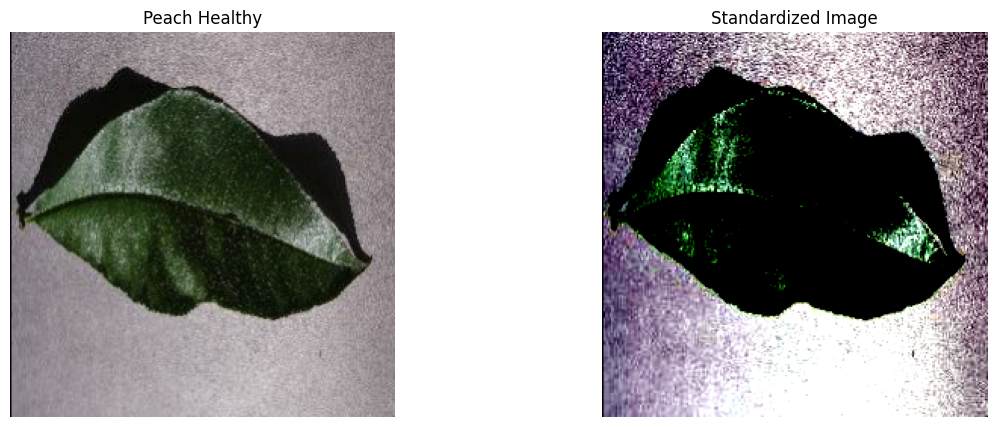

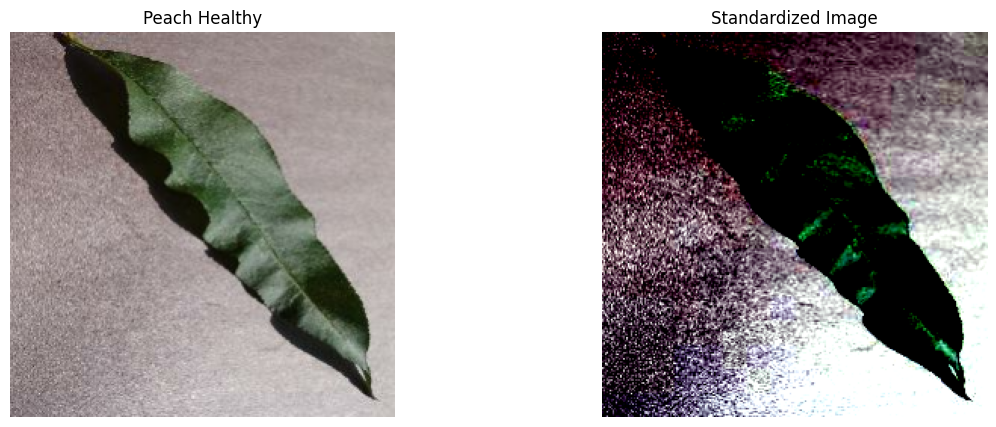

In [ ]:
# Plot random standardized plant leaf images 
from sklearn.preprocessing import StandardScaler

def std_img(img):
    img_flat = img.reshape(-1,3)
    scaler = StandardScaler()
    img_std = scaler.fit_transform(img_flat)
    img_std = img_std.reshape(255,255,3)
    return img_std

peach_img = []
peach_label = []

for img, label in train_dataset['Peach'].take(1):
    for i in range(5):
        peach_img.append(img[i])
        peach_label.append(classes['Peach'][label[i]])
        
for i in range(5):
    nik = np.array(peach_img[i]).astype('uint8')
    img_std = std_img(nik)
    
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)
    plt.imshow(nik)
    plt.title("Peach " + peach_label[i])
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(img_std)
    plt.title('Standardized Image')
    plt.axis('off')

plt.show()

Image size: 255 X 255
Patch size: 32 X 32
Patches per image: 49
Elements per patch: 3072


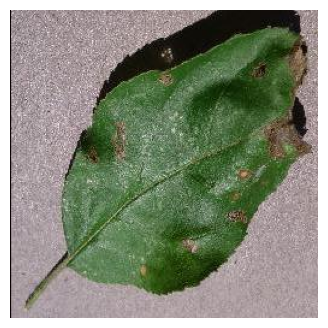

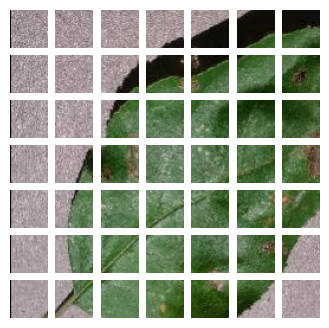

In [ ]:
# Plotting the patch format of an image

image_size = 255 
img_height, img_width = 510, 510
patch_size = 32
num_patches = (image_size // patch_size) ** 2
class Patches(layers.Layer):
    
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        super(Patches, self).__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches
    
    
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(4, 4))

target = "D:/Jobs/plant disease prediction/Plant Disease Dataset/Apple/Train/Black Rot/"
random_num = random.choice(os.listdir(target))
image = mpimg.imread("D:/Jobs/plant disease prediction/Plant Disease Dataset/Apple/Train/Black Rot/" + random_num)
plt.imshow(image.astype("uint8"))
plt.axis("off")
resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")
n = int(np.sqrt(patches.shape[1]))
plt.figure(figsize=(4, 4))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 3))
    plt.imshow(patch_img.numpy().astype("uint8"))
    plt.axis("off")

In [ ]:
# Listing the name plant leaves for model development.

plants = ["Potato","Tomato", "Bell Pepper", "Corn (Maize)"]

base_dir = "D:/Jobs/plant disease prediction/Plant Disease Dataset"


In [ ]:
# Declaring paths for training, testing and validation for the given plant disease
for plant in plants:
    print(f"\n.....Processing plant: {plant}")
    
    train_path = os.path.join(base_dir, plant, "Train")
    test_path = os.path.join(base_dir, plant, "Test")
    val_path = os.path.join(base_dir, plant, "Val")
    
    if not os.path.exists(train_path):
        print(f"Train path does not exit for {plant}: {train_path}")
        continue

    out_labels = os.listdir(train_path)
    out_len = len(out_labels)
    
    print(f"Train path: {train_path}")
    print(f"Test path: {test_path}")
    print(f"Validation path: {val_path}")
    print(f"Classes: {out_labels}")
    print(f"Number of classes: {out_len}")


.....Processing plant: Potato
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Potato\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Potato\Test
Validation path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Potato\Val
Classes: ['Early Blight', 'Healthy', 'Late Blight']
Number of classes: 3

.....Processing plant: Tomato
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Tomato\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Tomato\Test
Validation path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Tomato\Val
Classes: ['Bacterial Spot', 'Early Blight', 'Healthy', 'Late Blight', 'Septoria Leaf Spot', 'Yellow Leaf Curl Virus']
Number of classes: 6

.....Processing plant: Bell Pepper
Train path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Bell Pepper\Train
Test path: D:/Jobs/plant disease prediction/Plant Disease Dataset\Bell Pepper\Test
Validation path: D:/Jobs/plant disease p

In [ ]:
# Set the batch size and image size
batch_size = 32
img_height = 255

# Set the Image data generator for training,testing, validation sets
train_gen = ImageDataGenerator(rescale=1./255., rotation_range=20, shear_range=0.15, horizontal_flip=True)
test_gen = ImageDataGenerator(rescale=1./255)
val_gen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_set = train_gen.flow_from_directory(train_path, target_size= (img_height,img_height), batch_size=batch_size, shuffle=True, class_mode='categorical')

val_set = val_gen.flow_from_directory(val_path, target_size=(img_height,img_height), batch_size=batch_size, shuffle=False, class_mode='categorical')

test_set = test_gen.flow_from_directory(test_path, target_size=(img_height,img_height), batch_size=batch_size, shuffle=False, class_mode='categorical')

Found 7316 images belonging to 4 classes.
Found 1645 images belonging to 4 classes.
Found 188 images belonging to 4 classes.


In [ ]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

print("Available Devices:")
print(device_lib.list_local_devices())


Available Devices:
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 3341831488952787370
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 2903926375
locality {
  bus_id: 1
  links {
  }
}
incarnation: 2753884878919002945
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1050 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1"
xla_global_id: 416903419
]


In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_hub as hub
from tensorflow.keras.applications import Xception
from tensorflow.keras import layers, models


In [ ]:

# Model: Xception
base_model = Xception(
    weights="imagenet",  
    include_top=False, 
    input_shape=(255, 255,3),
)
base_model.trainable = False 

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(out_len, activation="softmax"),  
])

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)


print('Model Summary [Vision Transformer model with RESTNET50]')
model.summary()

Model Summary [Vision Transformer model with RESTNET50]
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 21,387,052
Trainable params: 525,572
Non-trainable p

In [ ]:
# Train the model
epochs = 15

history = model.fit(
    train_set,
    epochs=epochs,
    validation_data=val_set,
    verbose=1,
)


Epoch 1/15
229/229 [==============================] - 284s 1s/step - loss: 0.4501 - accuracy: 0.8502 - val_loss: 0.2280 - val_accuracy: 0.9240
Epoch 2/15
229/229 [==============================] - 154s 673ms/step - loss: 0.1981 - accuracy: 0.9337 - val_loss: 0.1739 - val_accuracy: 0.9416
Epoch 3/15
229/229 [==============================] - 151s 657ms/step - loss: 0.1533 - accuracy: 0.9474 - val_loss: 0.1523 - val_accuracy: 0.9404
Epoch 4/15
229/229 [==============================] - 160s 700ms/step - loss: 0.1376 - accuracy: 0.9534 - val_loss: 0.1465 - val_accuracy: 0.9483
Epoch 5/15
229/229 [==============================] - 160s 697ms/step - loss: 0.1260 - accuracy: 0.9576 - val_loss: 0.1289 - val_accuracy: 0.9489
Epoch 6/15
229/229 [==============================] - 162s 709ms/step - loss: 0.1186 - accuracy: 0.9563 - val_loss: 0.1238 - val_accuracy: 0.9562
Epoch 7/15
229/229 [==============================] - 165s 719ms/step - loss: 0.1078 - accuracy: 0.9595 - val_loss: 0.1179 - va

In [ ]:
# model_name = "_".join(plants) + "_model"
# model.save(model_name)

In [ ]:
Y_pred = model.predict(test_set, steps=len(test_set))
y_pred = np.argmax(Y_pred, axis=1)

y_pred

6/6 [==============================] - 5s 724ms/step


array([3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 3, 3, 0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 0, 3, 3, 3, 3], dtype=int64)

In [ ]:
scores = model.evaluate(test_set)

scores

6/6 [==============================] - 2s 343ms/step - loss: 0.1171 - accuracy: 0.9521


[0.11711802333593369, 0.9521276354789734]

In [ ]:

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

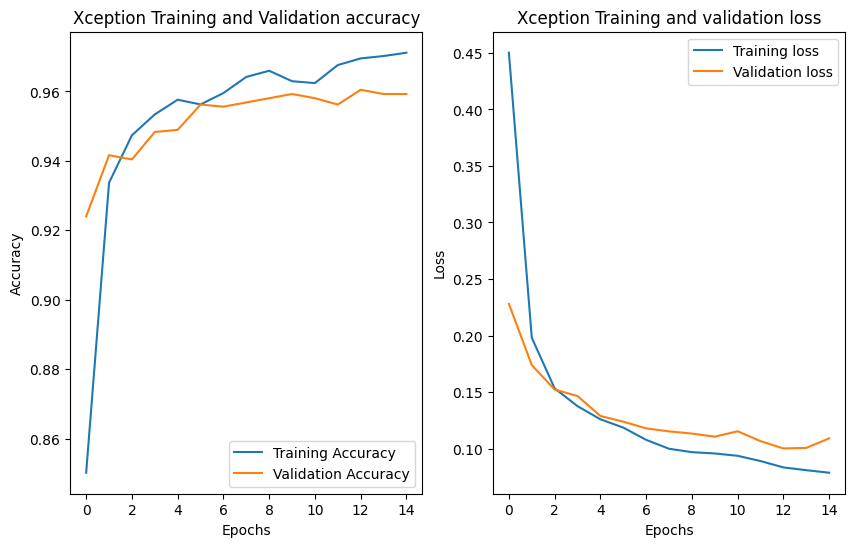

In [ ]:

# plot training and validation accuracy values

plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.plot(range(epochs), acc, label="Training Accuracy")
plt.plot(range(epochs), val_acc, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend(loc="lower right")
plt.title("Xception Training and Validation accuracy")


# Plot training and validation loss values

plt.subplot(1,2,2)
plt.plot(range(epochs), loss, label="Training loss")
plt.plot(range(epochs), val_loss, label="Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc="upper right")
plt.title("Xception Training and validation loss")
plt.show()



In [ ]:
from sklearn.metrics import classification_report

print(classification_report(test_set.classes, y_pred, target_names=out_labels))

                      precision    recall  f1-score   support

Cercospora Leaf Spot       0.95      0.87      0.91        45
         Common Rust       1.00      1.00      1.00        48
             Healthy       0.98      1.00      0.99        47
Northern Leaf Blight       0.88      0.94      0.91        48

            accuracy                           0.95       188
           macro avg       0.95      0.95      0.95       188
        weighted avg       0.95      0.95      0.95       188



First image to predict


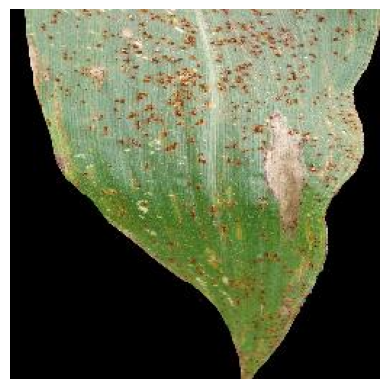

1/1 [==============================] - 0s 55ms/step
Actual label: Common Rust
Predicted label: Common Rust (Confidence: 1.00)


In [ ]:
# Reverse the class indices mapping (index to class name)
class_indices = {v: k for k, v in test_set.class_indices.items()}


images_batch, labels_batch = next(iter(test_set))
first_image = (images_batch[0] * 255).astype("uint8")  

# Map the first label from one-hot to class name
first_label_index = np.argmax(labels_batch[0])  
first_label = class_indices[first_label_index]  

print("First image to predict")
plt.imshow(first_image)
plt.axis("off")
plt.show()


predictions = model.predict(images_batch)
predicted_labels = [class_indices[np.argmax(pred)] for pred in predictions]

# Display the first prediction
confidence = predictions[0][np.argmax(predictions[0])]  
print(f"Actual label: {first_label}")
print(f"Predicted label: {predicted_labels[0]} (Confidence: {confidence:.2f})")


1/1 [==============================] - 0s 28ms/step


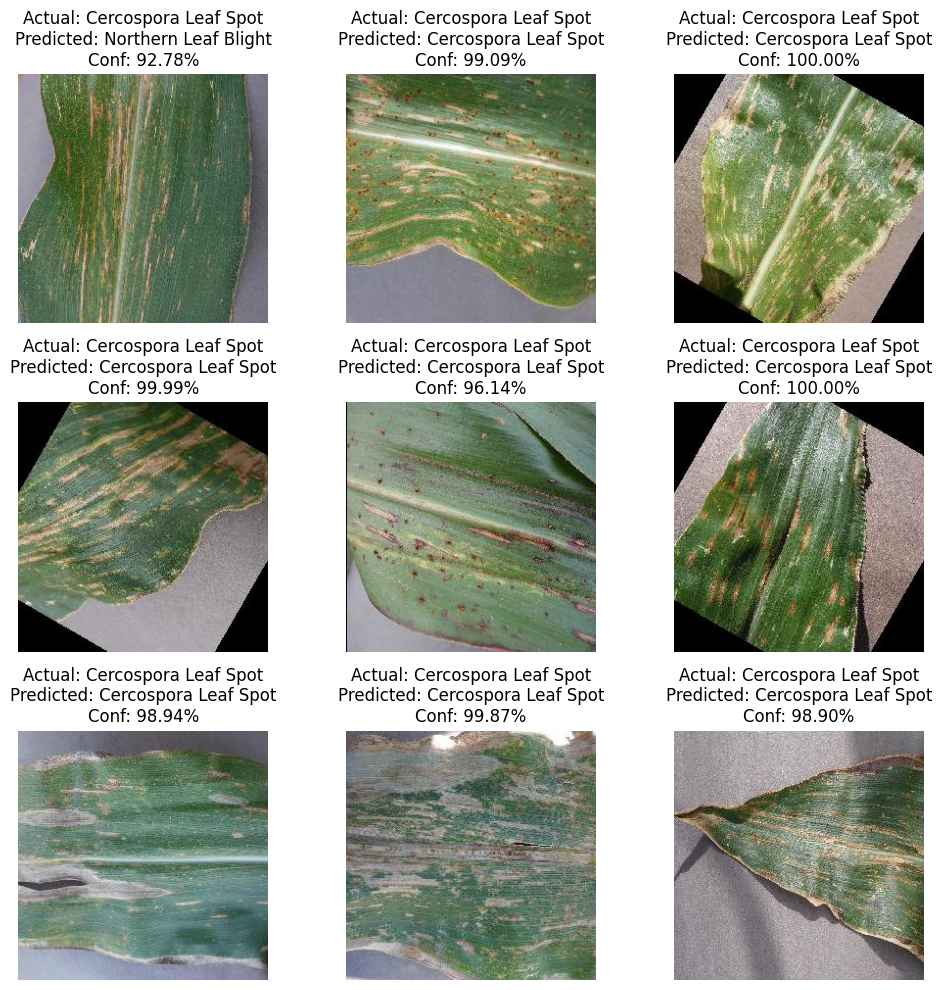

In [ ]:
# Function to predict and return the class name and confidence.
# Ensure the image is normalized and reshaped for prediction
def predict(model, img, class_names):
    
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)  
    
    predictions = model.predict(img_array)  
    predicted_index = np.argmax(predictions[0])  
    confidence = predictions[0][predicted_index] * 100  
    predicted_class = class_names[predicted_index]  

    return predicted_class, confidence




# Extract class names from the test set
class_names = list(test_set.class_indices.keys())
images_batch, labels_batch = next(iter(test_set))
# Rescale images
images_batch_rescaled = (images_batch * 255).astype("uint8")  

plt.figure(figsize=(10, 10))
for i in range(9):  
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_batch_rescaled[i])  
    
    # Get predictions and actual class
    predicted_class, confidence = predict(model, images_batch[i], class_names)
    actual_class = class_names[np.argmax(labels_batch[i])]  
   
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConf: {confidence:.2f}%")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_set) 

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")


6/6 [==============================] - 2s 339ms/step - loss: 0.1171 - accuracy: 0.9521
Test Loss: 0.11711802333593369
Test Accuracy: 0.9521276354789734


In [ ]:
import os

# model save paths
saved_model_dir = "../saved_model/plant_disease_Xception_model"
h5_model_path = "../saved_model/plant_disease_Xception_model.h5"

# Ensure the save directory exists
os.makedirs(os.path.dirname(saved_model_dir), exist_ok=True)

# Save as TensorFlow's SavedModel format (.keras)
model.save(saved_model_dir)
print(f"Model saved in Keras format: {saved_model_dir}")

# Save as HDF5 format (.h5)
model.save(h5_model_path)
print(f"Model saved in HDF5 format: {h5_model_path}")


INFO:tensorflow:Assets written to: ../saved_model/plant_disease_Xception_model\assets


INFO:tensorflow:Assets written to: ../saved_model/plant_disease_Xception_model\assets


Model saved in Keras format: ../saved_model/plant_disease_Xception_model
Model saved in HDF5 format: ../saved_model/plant_disease_Xception_model.h5


## Testing the Saved model

In [ ]:
# Load the saved model
model_path = "../saved_model/plant_disease_Xception_model"

loaded_model = tf.keras.models.load_model(model_path)

# Display the model summary to confirm it loads correctly
loaded_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 8, 8, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 21,387,052
Trainable params: 525,572
Non-trainable params: 20,861,480
______________________________________

In [ ]:
# Function to make predictions and return class name with confidence
class_names = list(test_set.class_indices.keys())

def predict(model, image, class_names):
    image = tf.image.resize(image, (255,255))
    image = np.expand_dims(image, axis=0)
    image = image / 255.0
    
    prediction = model.predict(image)
    predicted_class_idx = np.argmax(prediction)
    confidence = prediction[0][predicted_class_idx] * 100
    
    predicted_class = class_names[predicted_class_idx]
    return predicted_class, confidence


1/1 [==============================] - 0s 27ms/step


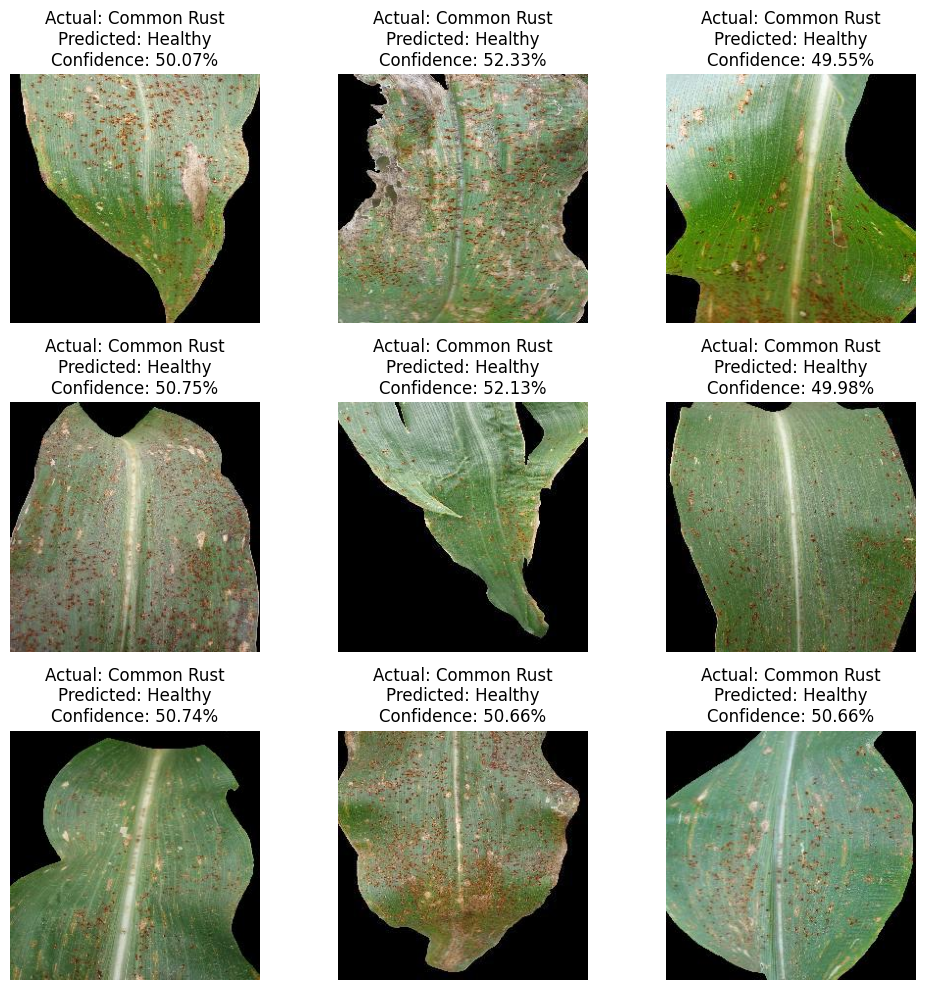

In [ ]:

# Get one batch from the test_set
images_batch, labels_batch = next(iter(test_set))  

# Rescale images for visualization
images_batch_rescaled = (images_batch * 255).astype("uint8") 
 
plt.figure(figsize=(10, 10))
for i in range(9):  
    plt.subplot(3, 3, i + 1)
    plt.imshow(images_batch_rescaled[i])
    plt.axis("off")
    
    predicted_class, confidence = predict(loaded_model, images_batch[i], class_names)
    actual_class = class_names[np.argmax(labels_batch[i])]
    
    plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%")

plt.tight_layout()
plt.show()